In [2]:
import collections
import pandas as pd
import spacy
import textacy
from tqdm import tqdm
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import calinski_harabasz_score, silhouette_score
import plotly.express as px
spacy.prefer_gpu()

False

In [3]:
df = pd.read_csv("data/preprocessedData/dev_questions.csv")

In [4]:
len(df)

11873

In [5]:
df.head()

,Unnamed: 0,paragraph_text,question_id,question_text,correct_answer_text,correct_answer_char_index,correct_answer_token_index,plausible_answer_text,plausible_answer_char_index,plausible_answer_token_index,paragraph_tokens
0,0,The Normans (Norman: Nourmands; French: Norman...,56ddde6b9a695914005b9628,In what country is Normandy located?,"['France', 'France', 'France', 'France']","[(159, 165), (159, 165), (159, 165), (159, 165)]","[(34, 35), (34, 35), (34, 35), (34, 35)]",[],[],[],"['The', 'Normans', '(', 'Norman', ':', 'Nourma..."
1,1,The Normans (Norman: Nourmands; French: Norman...,56ddde6b9a695914005b9629,When were the Normans in Normandy?,"['10th and 11th centuries', 'in the 10th and 1...","[(94, 117), (87, 117), (94, 117), (94, 117)]","[(21, 25), (19, 25), (21, 25), (21, 25)]",[],[],[],"['The', 'Normans', '(', 'Norman', ':', 'Nourma..."
2,2,The Normans (Norman: Nourmands; French: Norman...,56ddde6b9a695914005b962a,From which countries did the Norse originate?,"['Denmark, Iceland and Norway', 'Denmark, Icel...","[(256, 283), (256, 283), (256, 283), (256, 283)]","[(55, 60), (55, 60), (55, 60), (55, 60)]",[],[],[],"['The', 'Normans', '(', 'Norman', ':', 'Nourma..."
3,3,The Normans (Norman: Nourmands; French: Norman...,56ddde6b9a695914005b962b,Who was the Norse leader?,"['Rollo', 'Rollo', 'Rollo', 'Rollo']","[(308, 313), (308, 313), (308, 313), (308, 313)]","[(65, 66), (65, 66), (65, 66), (65, 66)]",[],[],[],"['The', 'Normans', '(', 'Norman', ':', 'Nourma..."
4,4,The Normans (Norman: Nourmands; French: Norman...,56ddde6b9a695914005b962c,What century did the Normans first gain their ...,"['10th century', 'the first half of the 10th c...","[(671, 683), (649, 683), (671, 675), (671, 675)]","[(127, 129), (122, 129), (127, 128), (127, 128)]",[],[],[],"['The', 'Normans', '(', 'Norman', ':', 'Nourma..."


In [6]:
import numpy as np
nlp = spacy.load("en_core_web_sm")
question_vec_list = []
question_token_list = []

for question_doc in tqdm(nlp.pipe(df["question_text"])):
    question_vec_list.append(question_doc.vector)
    question_token_list.append([token.text for token in question_doc])
    
question_array = np.array(question_vec_list)

11873it [00:23, 506.99it/s]


## ... using Word embeddings

In [7]:
X = question_array

In [8]:
ks = range(2,200,5)
calinski_harabasz_scores = []
silhouette_scores = []
inertias = []
#http://scikit-learn.org/stable/modules/generated/sklearn.metrics.calinski_harabaz_score.html
#http://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html

for k in tqdm(ks):
    kmeans = KMeans(n_clusters=k, random_state=0).fit(X)
    pred = kmeans.labels_
    calinski_harabasz_scores.append(calinski_harabasz_score(X, pred))
    silhouette_scores.append(silhouette_score(X,pred))
    inertias.append(kmeans.inertia_)

100%|██████████| 40/40 [20:50<00:00, 31.27s/it]


In [9]:
from sympy.geometry import Point
from sympy.geometry import Segment
distances = []

p1 = Point(ks[0],inertias[0])
p2 = Point(ks[-1],inertias[-1])
seg = Segment(p1, p2)
for i, k in enumerate(ks):
    p = Point(k,inertias[i])
    distances.append(float(seg.distance(p)))

In [10]:
best_k = ks[distances.index(max(distances))]

In [11]:
best_k

32

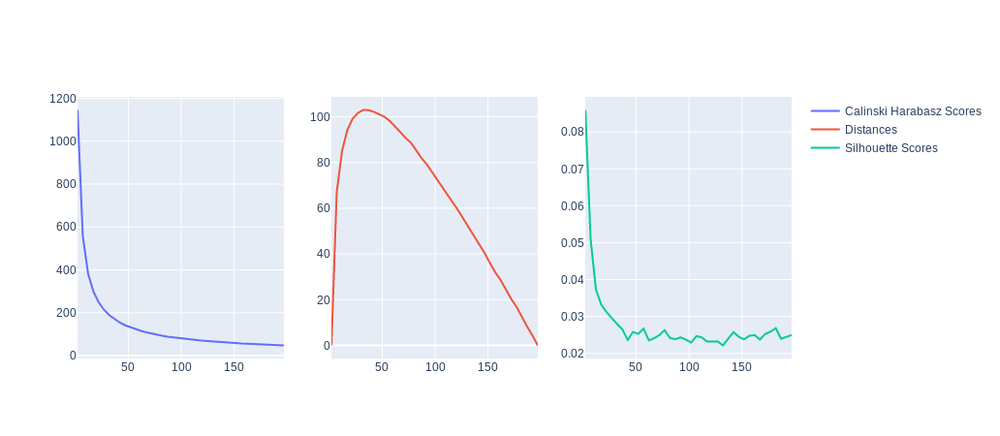

In [15]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(shared_xaxes=True,rows=1, cols=3)

fig.add_trace(
    go.Scatter(x=list(ks), y=calinski_harabasz_scores,  name="Calinski Harabasz Scores"),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=list(ks), y=distances, name="Distances"),
    row=1, col=2
)

fig.add_trace(
    go.Scatter(x=list(ks), y=silhouette_scores, name="Silhouette Scores"),
    row=1, col=3
)

In [16]:
kmeans = KMeans(n_clusters=best_k)
y_pred = kmeans.fit_predict(question_array)

In [17]:
X_reduced3 = PCA(n_components=3).fit_transform(question_array)
#X_reduced3 = TSNE(n_components=3).fit_transform(question_array)

In [18]:
X_reduced2 = PCA(n_components=2).fit_transform(question_array)
#X_reduced2 = TSNE(n_components=2).fit_transform(question_array)

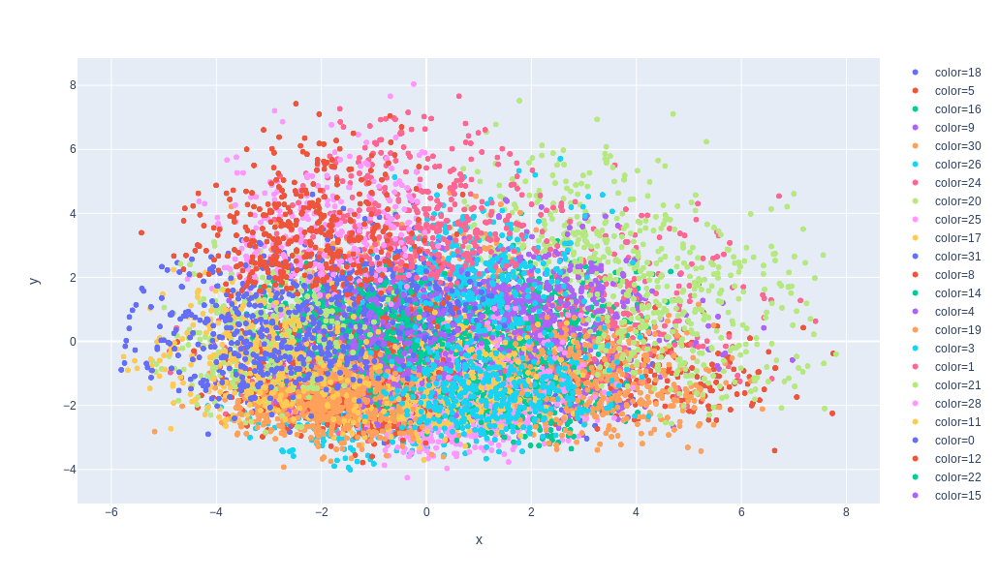

In [19]:
px.scatter(x=X_reduced2[:,0], y=X_reduced2[:,1], color=[str(y) for y in y_pred], hover_name=df["question_text"])

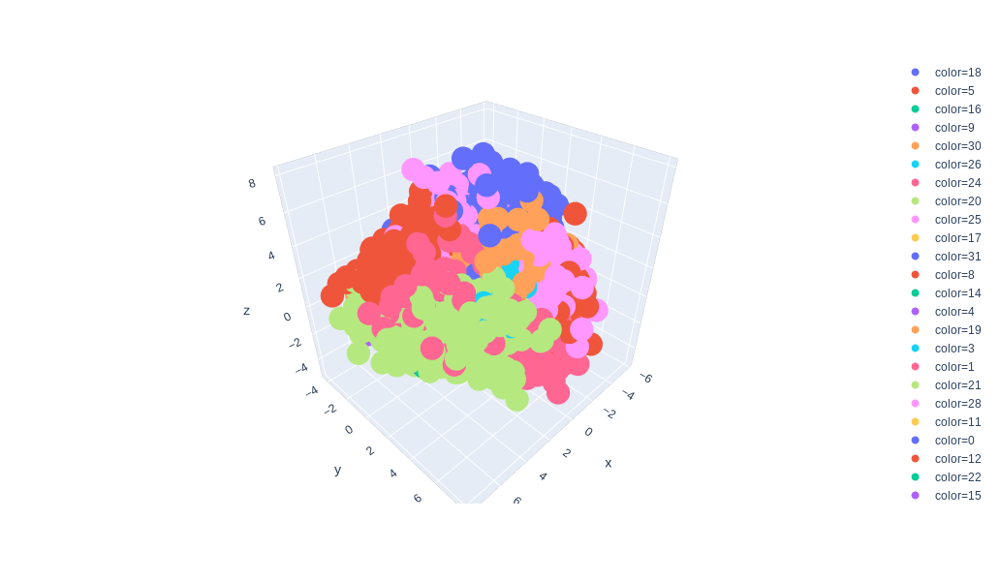

In [20]:
px.scatter_3d(x=X_reduced3[:,0], y=X_reduced3[:,1], z=X_reduced3[:,2], color=[str(y) for y in y_pred], hover_name=df["question_text"])

For n_clusters = 10 The average silhouette_score is : 0.0383064


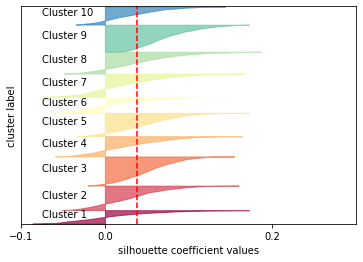

<Figure size 1500x1000 with 0 Axes>

For n_clusters = 20 The average silhouette_score is : 0.031734787


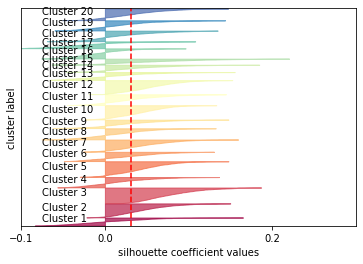

<Figure size 1500x1000 with 0 Axes>

For n_clusters = 30 The average silhouette_score is : 0.02796374


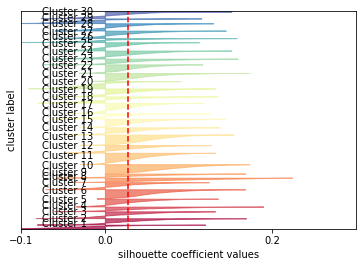

<Figure size 1500x1000 with 0 Axes>

In [23]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

range_n_clusters = [10,20,30]
colors = []

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1) = plt.subplots(1, 1)
    #fig.set_size_inches(18, 7)
    plt.figure(figsize=(7.5,5), dpi=200)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 0.3])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.Spectral(float(i) / n_clusters)
        colors.append(color)
        
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.075, y_lower + 0.5 * size_cluster_i, "Cluster " + str(i+1) + "   ")

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    #ax1.set_title("silhouette plot for the various clusters.")
    ax1.set_xlabel("silhouette coefficient values")
    ax1.set_ylabel("cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2])

    #plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
    #              "with n_clusters = %d" % n_clusters),
    #             fontsize=14, fontweight='bold')

    plt.show()

## ... using CountVectorizer

In [22]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
vectorizer = CountVectorizer(binary=True)
clusterer = KMeans(n_clusters=best_k, random_state=10)
cluster_labels = clusterer.fit_predict(X)

for cluster in range(0, best_k-2):
    print(cluster)
    sentences = df[cluster_labels == cluster]["question_text"]
    
    if len(sentences) > 0:
        X_count = vectorizer.fit_transform(sentences)
        
        X_count_sum = list(np.asarray(np.sum(X_count, axis=0)).reshape(-1) / len(sentences))

        ordered_features = list(zip(vectorizer.get_feature_names(), X_count_sum))
        ordered_features = sorted(ordered_features ,key=lambda x: x[1], reverse=True)
        print(ordered_features[:5])

0
[('did', 0.8), ('the', 0.5153846153846153), ('what', 0.5), ('to', 0.4461538461538462), ('who', 0.16538461538461538)]
1
[('what', 0.9081081081081082), ('is', 0.8054054054054054), ('of', 0.6846846846846847), ('the', 0.6162162162162163), ('in', 0.2126126126126126)]
2
[('what', 0.7445109780439122), ('is', 0.5229540918163673), ('of', 0.44510978043912175), ('the', 0.37325349301397204), ('in', 0.281437125748503)]
3
[('is', 0.7749360613810742), ('what', 0.690537084398977), ('the', 0.4833759590792839), ('of', 0.2531969309462916), ('in', 0.18414322250639387)]
4
[('is', 0.9119804400977995), ('the', 0.7555012224938875), ('what', 0.6699266503667481), ('of', 0.31784841075794623), ('in', 0.2616136919315403)]
5
[('who', 0.5891089108910891), ('the', 0.5396039603960396), ('what', 0.3910891089108911), ('was', 0.10396039603960396), ('in', 0.08415841584158416)]
6
[('the', 0.62), ('what', 0.49666666666666665), ('did', 0.3333333333333333), ('to', 0.32), ('of', 0.2633333333333333)]
7
[('the', 0.614432989690

## PMI (Pointwise mutual information)

In [ ]:
#vectorizer.get_feature_names()

|word 1 | cluster | count word 1 | count cluster | count of co-occurrences | PMI |
|-------|---------|--------------|---------------|-------------------------|-----|
|"what" | 1       | total what   | total 1       | what in 1               | PMI |